## Problem statement: identify the notes among the birds' singing. 
### author: Vadym Tunik

In [ ]:
import os
import librosa
import numpy as np
import matplotlib.pyplot as plt

### Let's look for an example of bird sound (some ukrainian bird)

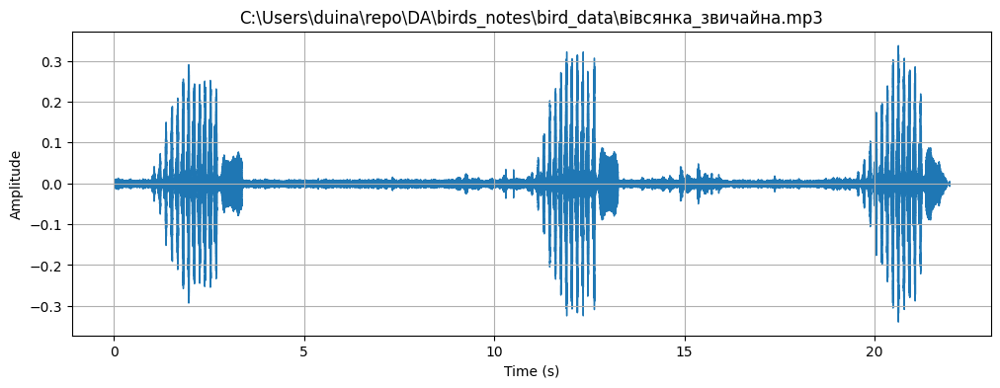

In [65]:
audiopath = r'C:\Users\duina\repo\DA\birds_notes\bird_data\вівсянка_звичайна.mp3'
y, sr = librosa.load(audiopath)

plt.figure(figsize=(12, 4))
librosa.display.waveshow(y, sr=sr)
plt.title(f'{audiopath}')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

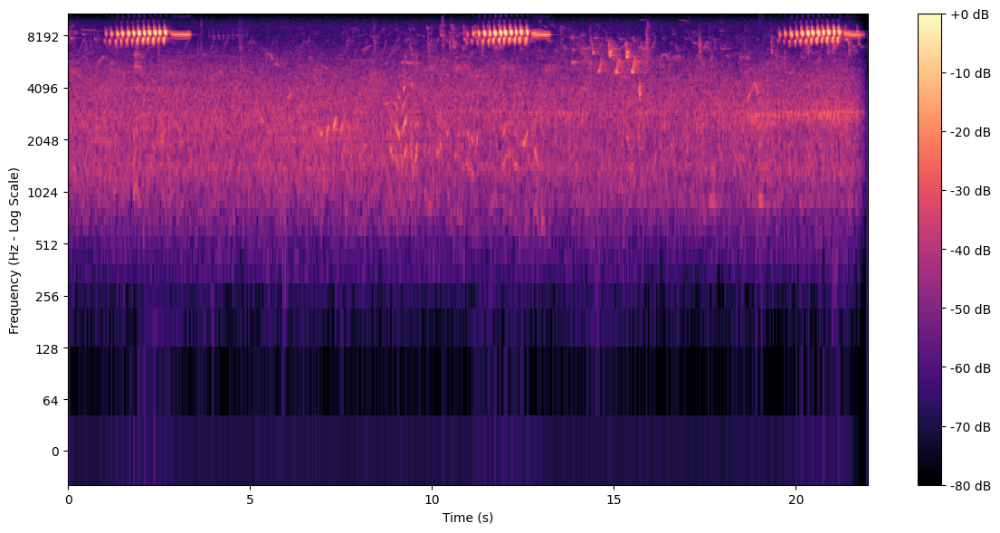

In [66]:
S = librosa.feature.melspectrogram(y=y, sr=sr)
S_db = librosa.power_to_db(S, ref=np.max)

plt.figure(figsize=(12, 6))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.ylabel('Frequency (Hz - Log Scale)')
plt.xlabel('Time (s)')
plt.tight_layout()
plt.show()

### Ok, its look like we have three times repeated sequence of 3 notes.
### Define note as some frequency (Hz) with highest power (dB) at each time frame.

In [67]:
def get_notes_from_audio_peaks(mp3_path, hop_length=512, n_fft=2048, onset_backtrack=True, onset_wait=0.05, db_threshold=-30):
    """
    Detects peaks (onsets) in an audio file, finds the dominant frequency
    at each peak, converts it to a musical note, and returns the sequence.

    Args:
        mp3_path (str): Path to the input MP3 file.
        hop_length (int): Number of samples between successive frames for STFT and onset detection.
        n_fft (int): Length of the FFT window for STFT.
        onset_backtrack (bool): If True, shifts onset frames slightly earlier to capture attack.
        onset_wait (float): Minimum time (in seconds) to wait between detected onsets.
        db_threshold (float): Minimum dB level for a frequency peak at an onset to be considered a note.

    Returns:
        tuple: A tuple containing:
            - note_sequence (list): A list of dictionaries, each with 'time', 'note', 'frequency', 'db'.
            - S_db (np.ndarray): The full spectrogram in decibels.
            - sr (int): The audio sampling rate.
            - onset_times (np.ndarray): Times (in seconds) of detected onsets.
    """
    print(f"\nAnalyzing file: {mp3_path}")
    note_sequence = []

    if not os.path.exists(mp3_path):
        print(f"Error: File not found at {mp3_path}")
        return None, None, None, None

    try:
        y, sr = librosa.load(mp3_path, sr=None)
        S_db = librosa.amplitude_to_db(np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length)), ref=np.max)

        wait_frames = int(np.ceil(onset_wait * sr / hop_length))
        onset_frames = librosa.onset.onset_detect(y=y, sr=sr, hop_length=hop_length,
                                                  units='frames', backtrack=onset_backtrack,
                                                  wait=wait_frames)

        if len(onset_frames) == 0:
            print("No significant onsets detected.")
            return [], S_db, sr, np.array([])

        onset_times = librosa.frames_to_time(onset_frames, sr=sr, hop_length=hop_length)
        print(f"Detected {len(onset_frames)} onset events (peaks).")

        fft_freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)

        for i, frame_idx in enumerate(onset_frames):
            if frame_idx >= S_db.shape[1]:
                print(f"Warning: Onset frame {frame_idx} out of bounds (max: {S_db.shape[1]-1}). Skipping.")
                continue

            spectrogram_at_onset = S_db[:, frame_idx]

            peak_bin = np.argmax(spectrogram_at_onset)
            peak_db = spectrogram_at_onset[peak_bin]

            if peak_db < db_threshold:
                print(f"  - Skipping peak at {onset_times[i]:.3f}s (dB {peak_db:.2f} < {db_threshold})")
                continue # Skip notes that are too quiet

            peak_frequency = fft_freqs[peak_bin]

            note_name = librosa.hz_to_note(peak_frequency, cents=False)

            note_info = {
                'time': onset_times[i],
                'note': note_name,
                'frequency': peak_frequency,
                'db': peak_db
            }
            note_sequence.append(note_info)

        return note_sequence, S_db, sr, onset_times

    except Exception as e:
        print(f"An error occurred during analysis: {e}")
        import traceback
        traceback.print_exc()
        return None, None, None, None
    
dir = r'bird_data'
results = []
db_threshold_ = -20
hop_length_ = 512
for mp3_path in [os.path.join(dir, f) for f in os.listdir(dir) if f.endswith('.mp3')]:
    notes, spectrogram, sample_rate, all_onset_times = get_notes_from_audio_peaks(mp3_path,hop_length=hop_length_,n_fft=2048,onset_wait=0.07,db_threshold=db_threshold_)
    results.append([notes, spectrogram, sample_rate, all_onset_times,mp3_path])


Analyzing file: bird_data\вівсянка_звичайна.mp3
Detected 53 onset events (peaks).
  - Skipping peak at 0.023s (dB -44.21 < -20)
  - Skipping peak at 1.022s (dB -35.16 < -20)
  - Skipping peak at 1.184s (dB -20.79 < -20)
  - Skipping peak at 1.440s (dB -33.78 < -20)
  - Skipping peak at 1.591s (dB -35.04 < -20)
  - Skipping peak at 2.032s (dB -24.43 < -20)
  - Skipping peak at 2.183s (dB -21.34 < -20)
  - Skipping peak at 3.669s (dB -40.31 < -20)
  - Skipping peak at 8.382s (dB -39.46 < -20)
  - Skipping peak at 9.892s (dB -36.99 < -20)
  - Skipping peak at 10.286s (dB -34.72 < -20)
  - Skipping peak at 10.495s (dB -40.30 < -20)
  - Skipping peak at 10.867s (dB -38.61 < -20)
  - Skipping peak at 11.122s (dB -21.03 < -20)
  - Skipping peak at 11.680s (dB -20.92 < -20)
  - Skipping peak at 11.807s (dB -30.71 < -20)
  - Skipping peak at 12.736s (dB -32.09 < -20)
  - Skipping peak at 14.141s (dB -35.79 < -20)
  - Skipping peak at 14.338s (dB -41.09 < -20)
  - Skipping peak at 14.861s (dB -

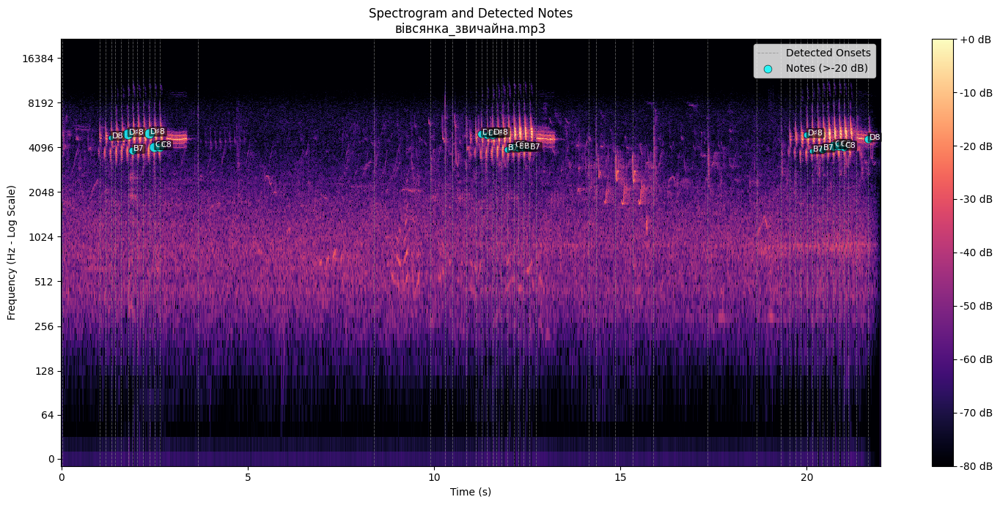

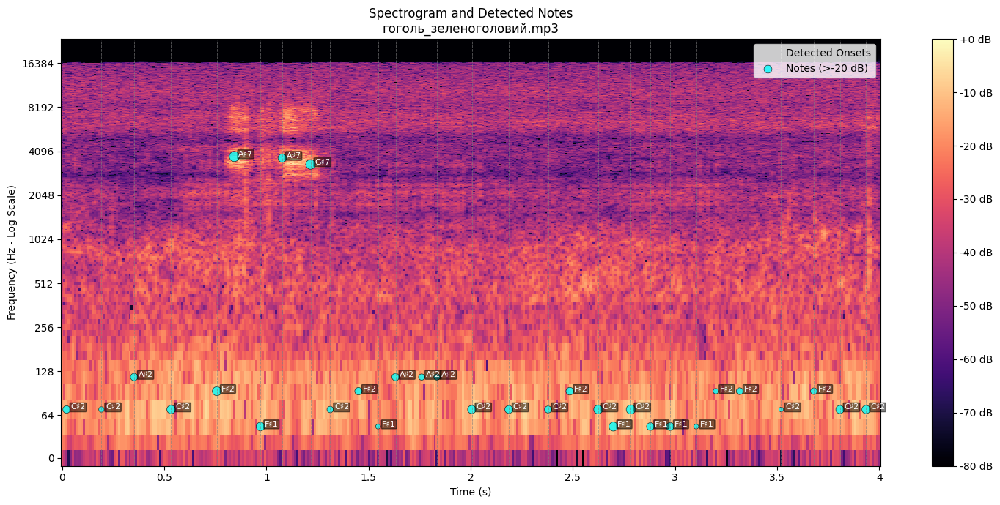

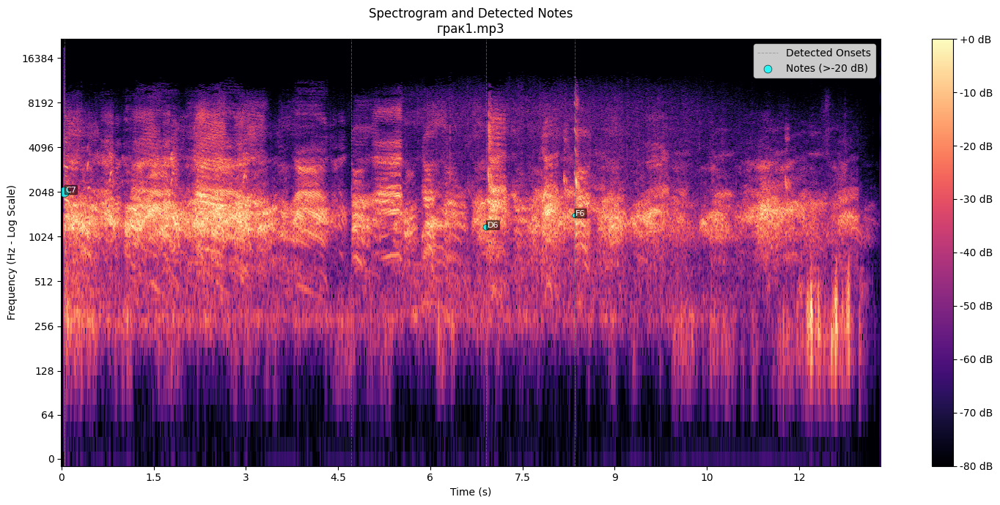

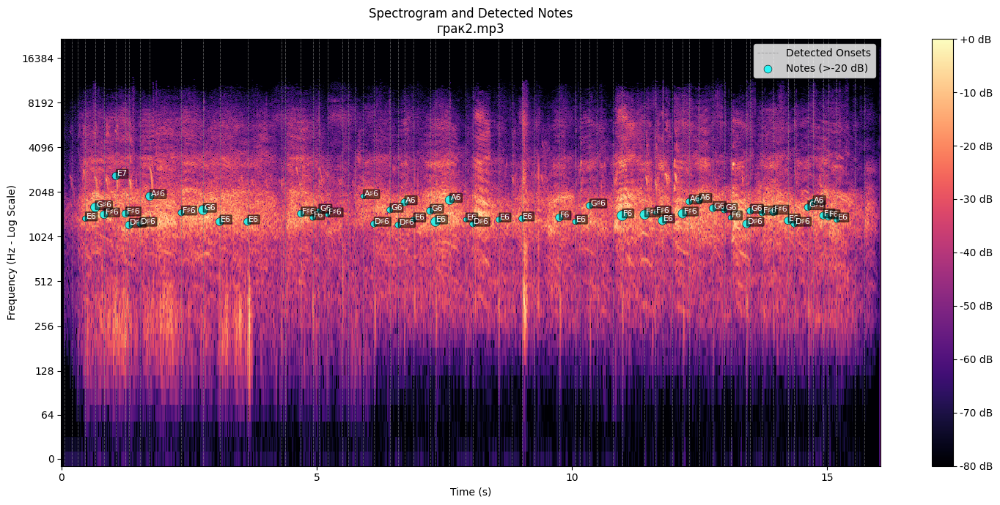

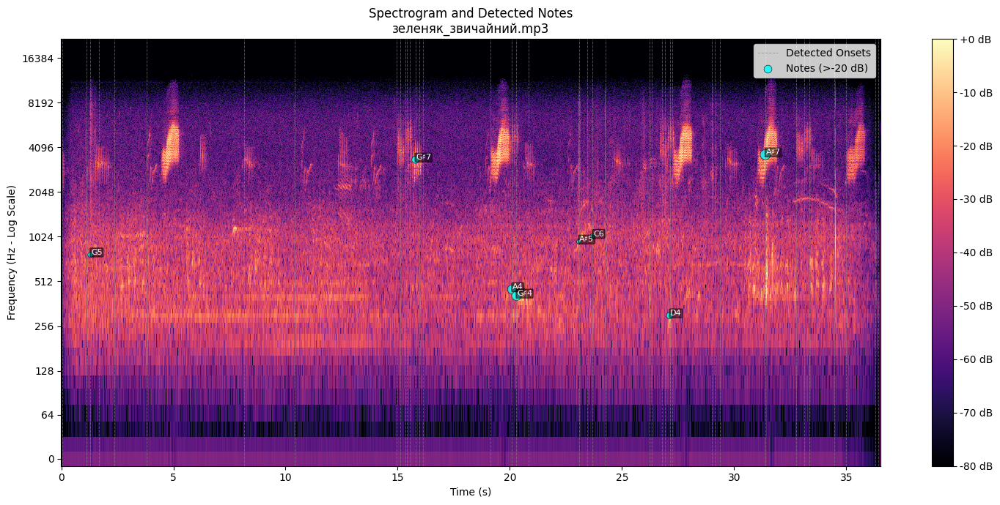

...

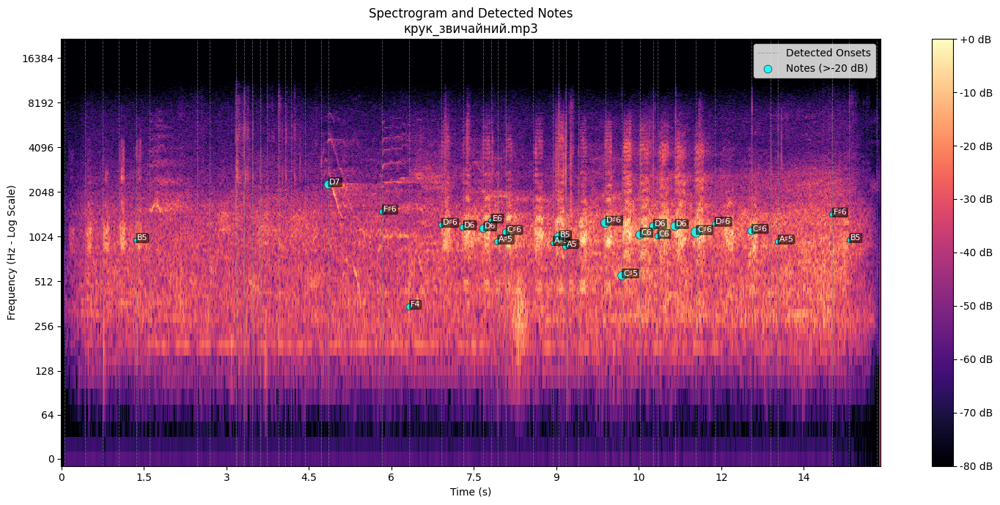

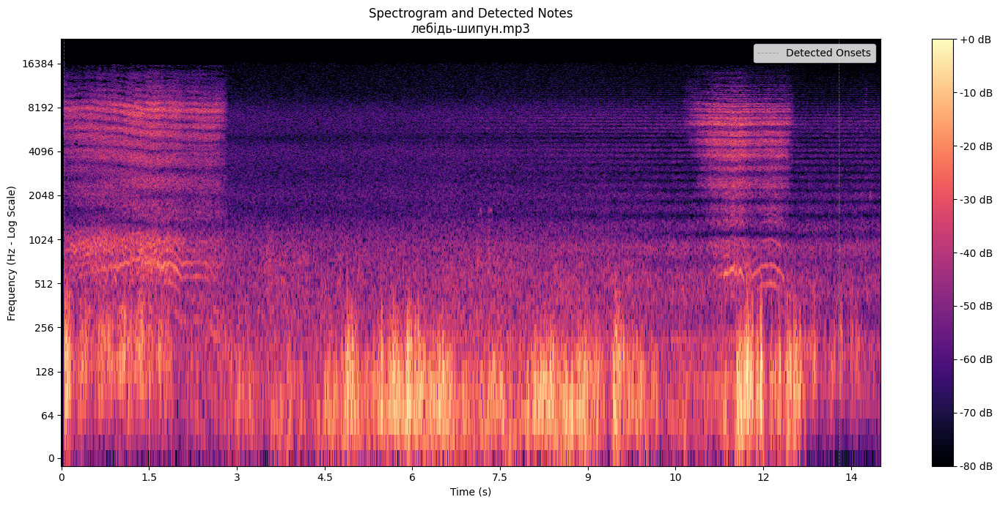

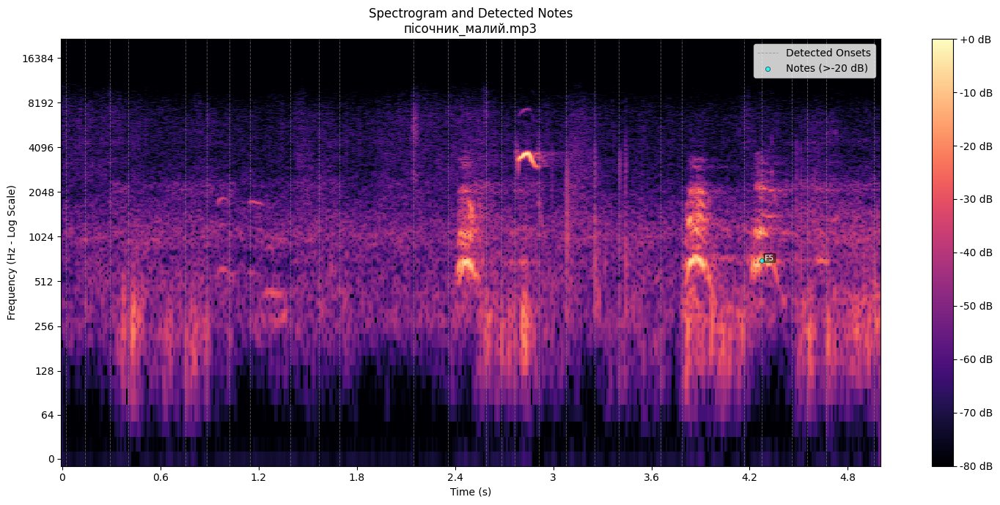

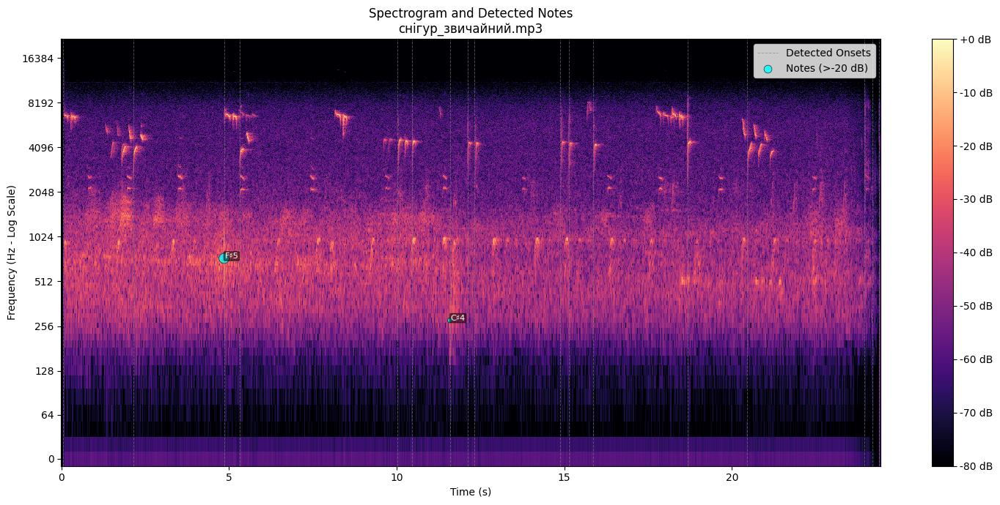

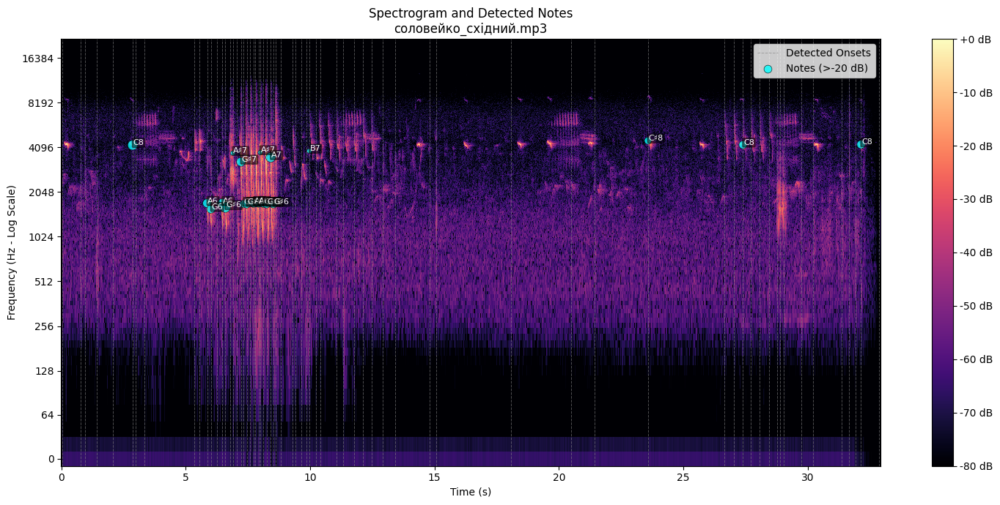

In [68]:
def plot_spectrogram_and_notes(S_db, sr, hop_length, note_sequence, onset_times, mp3_path):
    plt.figure(figsize=(15, 7))
    librosa.display.specshow(S_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='magma')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram and Detected Notes\n{os.path.basename(mp3_path)}')
    plt.ylabel('Frequency (Hz - Log Scale)')
    plt.xlabel('Time (s)')

    if len(onset_times) > 0:
        plt.vlines(onset_times, plt.ylim()[0], plt.ylim()[1], color='gray', linestyle='--', linewidth=0.7, alpha=0.6, label='Detected Onsets')

    if note_sequence:
        times = [n['time'] for n in note_sequence]
        freqs = [n['frequency'] for n in note_sequence]
        notes = [n['note'] for n in note_sequence]
        dbs = [n['db'] for n in note_sequence]

        min_db = min(dbs) if dbs else -60
        max_db = max(dbs) if dbs else 0
        sizes = [20 + 80 * (db - min_db) / (max_db - min_db + 1e-6) for db in dbs] # Scale size between 20 and 100 based on dB

        plt.scatter(times, freqs, c='cyan', s=sizes, marker='o', edgecolors='black', linewidth=0.5, alpha=0.8, label=f'Notes (>{db_threshold_} dB)')

        for i in range(len(note_sequence)):
           plt.text(times[i] + 0.02, freqs[i], notes[i], fontsize=8, color='white', bbox=dict(boxstyle='round,pad=0.1', fc='black', alpha=0.5))

    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

for notes, spectrogram, sample_rate, all_onset_times, mp3_path in results:
    plot_spectrogram_and_notes(spectrogram,sample_rate,hop_length_,notes,all_onset_times,mp3_path)

### Some results are shitty due to poor recording quality or a lot of noise, but in general we got satisfactory results. :)